In [1]:
# This filters any outputs from libraries that we don't want to see, and clear_output removes any outputs generated by a cell
from IPython.display import clear_output
import warnings
warnings.filterwarnings('ignore')
clear_output()

In [2]:
import numpy as np
import pandas as pd

# Visualisation libraries
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import missingno as msno #For missing value visualization

# From here: https://www.tutorialspoint.com/plotly/plotly_plotting_inline_with_jupyter_notebook.htm
import plotly.offline as py
py.init_notebook_mode(connected=True)

import time

import re
import string

In [3]:
data = pd.read_csv('../data-collection/tracks_with_features_demo.csv')
data.head()

,id,name,artists_ids,album,preview_url,duration_ms,popularity,explicit,artist_names,artist_genres,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,0V3wPSX9ygBnCm8psDIegu,Anti-Hero,06HL4z0CvFAxyc27GXpf02,Midnights,https://p.scdn.co/mp3-preview/d618210939db5375...,200690,97,False,Taylor Swift,pop,...,4,-6.571,1,0.0519,0.1300,0.000002,0.1420,0.533,97.008,4
1,1Qrg8KqiBpW07V7PNxwwwL,Kill Bill,7tYKF4w9nC0nq9CsPZTHyP,SOS,https://p.scdn.co/mp3-preview/6da21541af45fb6b...,153946,74,False,SZA,pop/r&b,...,8,-5.747,1,0.0391,0.0521,0.144000,0.1610,0.418,88.980,4
2,2dHHgzDwk4BJdRwy9uXhTO,Creepin' (with The Weeknd & 21 Savage),0iEtIxbK0KxaSlF7G42ZOp/1Xyo4u8uXC1ZmMpatF05PJ/...,HEROES & VILLAINS,https://p.scdn.co/mp3-preview/c5e0da24d37a1e39...,221520,90,True,Metro Boomin/The Weeknd/21 Savage,rap/canadian contemporary r&b/canadian pop/pop...,...,1,-6.005,0,0.0484,0.4170,0.000000,0.0822,0.172,97.950,4
3,3nqQXoyQOWXiESFLlDF1hG,Unholy (feat. Kim Petras),2wY79sveU1sp5g7SokKOiI/3Xt3RrJMFv5SZkCfUE8C1J,Unholy (feat. Kim Petras),https://p.scdn.co/mp3-preview/9ad533082a26a9c0...,156943,100,False,Sam Smith/Kim Petras,dance pop/pop/uk pop/dance pop/pop/post-teen p...,...,2,-7.375,1,0.0864,0.0130,0.000005,0.2660,0.238,131.121,4
4,0WtM2NBVQNNJLh6scP13H8,Calm Down (with Selena Gomez),46pWGuE3dSwY3bMMXGBvVS/0C8ZW7ezQVs4URX5aX7Kqx,Calm Down (with Selena Gomez),https://p.scdn.co/mp3-preview/ac634637e3bef42c...,239317,93,False,Rema/Selena Gomez,nigerian pop/dance pop/pop/post-teen pop,...,11,-5.206,1,0.0381,0.3820,0.000669,0.1140,0.802,106.999,4


In [4]:
data.shape

(54373, 22)

In [5]:
data.nunique()

id                  54373
name                46840
artists_ids         31893
album               40311
preview_url         53669
duration_ms         37050
popularity             99
explicit                2
artist_names        30880
artist_genres       16382
danceability         1230
energy               2450
key                    12
loudness            20204
mode                    2
speechiness          1329
acousticness         4311
instrumentalness     5198
liveness             1637
valence              1713
tempo               35801
time_signature          5
dtype: int64

In [6]:
data[data.isnull().any(axis=1)]

,id,name,artists_ids,album,preview_url,duration_ms,popularity,explicit,artist_names,artist_genres,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
38,3NanY0K4okhIQzL33U5Ad8,Boy's a liar,78rUTD7y6Cy67W1RVzYs7t,Boy's a liar,https://p.scdn.co/mp3-preview/a3e236f30998aa46...,131253,82,False,PinkPantheress,NaN,...,5,-8.407,1,0.0410,0.25000,0.002810,0.2070,0.740,132.981,4
56,7yBEKiv1LmO7GM4rOejhcW,SPIT IN MY FACE!,4MvZhE1iuzttcoyepkpfdF,SPIT IN MY FACE!,https://p.scdn.co/mp3-preview/11c722208c954edc...,147874,80,True,ThxSoMch,NaN,...,8,-6.512,1,0.0550,0.04640,0.022700,0.1110,0.652,94.107,4
87,3Y2MvObZdPakD1X71KOxCD,Teenage Dream,3jTU1IOqkO7Mz4zdbXPose,Teenage Dream,https://p.scdn.co/mp3-preview/b55bdbba6cbc9e14...,177857,82,False,Stephen Dawes,NaN,...,10,-9.570,1,0.0280,0.38000,0.000000,0.0844,0.244,111.991,4
88,26AmP3ukYC4Zs9lSGlh55I,Take me home,78rUTD7y6Cy67W1RVzYs7t,Take me home,https://p.scdn.co/mp3-preview/62ac334d7054570d...,200653,0,False,PinkPantheress,NaN,...,11,-8.304,0,0.0609,0.17300,0.149000,0.1110,0.461,172.072,4
90,4c70PG49Nuw2LKaMwECqvv,Runaway,21z8to3YxZXgKYJpBB54P2,Runaway,https://p.scdn.co/mp3-preview/7759defbc4371730...,150366,57,False,Daniel Seavey,NaN,...,3,-6.883,1,0.0461,0.18700,0.000063,0.0958,0.370,140.031,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54322,5cR458T2K00QovnaTO8bSj,Mercy,1YPZK8wRkpV1pyTD3OsgBh,Mercy,https://p.scdn.co/mp3-preview/7fab65f7fd0d47da...,220970,35,False,War & Pierce,NaN,...,1,-9.007,1,0.1430,0.32800,0.000000,0.1050,0.456,83.997,4
54324,5Wj3LM6AppledVJpn9mihn,Call It A Day,1y4kcaSxQkyNAHI9NfzRXz,Far From Broken,https://p.scdn.co/mp3-preview/b8c04259883d21e0...,223400,34,False,Leon Creek,NaN,...,9,-6.233,1,0.0547,0.02890,0.000003,0.3710,0.756,200.179,4
54336,2TQjuRQINEQxEWpqaGZM7F,Baby We're Through,69cpkpEaffiFjwcE19bvor,Baby We're Through,https://p.scdn.co/mp3-preview/8b07d2cccd3358fa...,236543,33,False,Ghost Hounds,NaN,...,2,-8.811,1,0.0914,0.00276,0.005480,0.1080,0.277,172.725,4
54353,3Ph7cIWmtuvYYM0MSirpBo,Worth It,2uYZJqMXH5Q6xvPU6BPySL,Already Dead,https://p.scdn.co/mp3-preview/a7aced504c531706...,285000,29,False,Willy Mason,NaN,...,11,-7.701,0,0.0422,0.07290,0.001310,0.0895,0.578,155.005,4


In [7]:
# show all rows where anything is null except for rows where artist_genre is null
data[data.isnull().any(axis=1) & ~data['artist_genres'].isnull()]

,id,name,artists_ids,album,preview_url,duration_ms,popularity,explicit,artist_names,artist_genres,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
914,1Y4ZdPOOgCUhBcKZOrUFiS,Lip Gloss,5qK5bOC6wLtuLhG5KvU17c,Lip Gloss,NaN,219773,65,False,Lil Mama,hip pop/pop rap/trap queen,...,2,-4.956,1,0.5010,0.41000,0.000001,0.0571,0.940,188.772,4
1534,0M8V3c7fPNxohyXFXSpVSD,"God Rest Ye Merry, Gentlemen",70kYiT1DhBuwkjGzASOeYV,The Sing-Off: Harmonies for the Holidays,NaN,156026,38,False,The Whiffenpoofs,a cappella/college a cappella,...,4,-6.725,0,0.0342,0.87700,0.000000,0.0980,0.373,112.550,4
1857,1T20tqHKrePjszGOdbFOEd,Take A Hint (feat. Victoria Justice & Elizabet...,1KYszkVzlhV3rAqmAcYIgd/2OTfr6S2kuHRYStjt1IkY6/...,Victorious 2.0: More Music From The Hit TV Sho...,NaN,154000,64,False,Victorious Cast/Victoria Justice/Elizabeth Gil...,dance pop/post-teen pop/post-teen pop,...,3,-2.712,1,0.0641,0.00443,0.000000,0.0718,0.747,133.995,4
1903,2cOpRVjsE4qZLZbFOB47VJ,L.A. Boyz,1KYszkVzlhV3rAqmAcYIgd/2OTfr6S2kuHRYStjt1IkY6/...,Victorious 3.0: Even More Music From The Hit T...,NaN,179600,50,False,Ariana Grande/Victorious Cast/Victoria Justice,dance pop/pop/dance pop/post-teen pop/post-tee...,...,8,-3.316,0,0.1240,0.01090,0.000000,0.0806,0.714,150.038,4
3517,4YtoipFgf4k0AfD17ZfD5X,"Nuthin' But A ""G"" Thang",6DPYiyq5kWVQS4RGwxzPC7/7hJcb9fa4alzcOq3EaNPoG,The Chronic,NaN,238466,4,True,Snoop Dogg/Dr. Dre,g funk/gangster rap/hip hop/pop rap/rap/west c...,...,11,-8.180,0,0.2790,0.00575,0.000000,0.1460,0.655,94.605,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53614,2zpNi06avggsxZIU7eYcBe,Not Home Anymore (Live at Sun Studio),2iul6etLF5hjjpxo43rzz7,Not Home Anymore (Live at Sun Studio),NaN,195851,0,False,Lera Lynn,alternative country/new americana,...,9,-10.503,0,0.0426,0.92500,0.000273,0.0861,0.419,177.663,4
53643,6YFBr5XJl2Nap9uPcdSW9Q,The Navigator,2xLEV2jDreAOcpJXFNoXyt,The Navigator,NaN,187280,0,False,Hurray For The Riff Raff,alternative country/indie pop/new americana/ne...,...,8,-6.677,1,0.0248,0.44300,0.000564,0.3040,0.594,111.782,4
53803,3RVbbNzSF5ssXTuwaqU3lB,Diggin' for the Devil,42RdLjlYHXrItRmmin0V0t,Pigalle,NaN,184920,28,False,Flip Grater,nz folk/nz indie/nz singer-songwriter,...,9,-10.106,1,0.0517,0.04250,0.531000,0.0836,0.412,121.984,4
53968,2nX2TPYt4QOuRdCfbPFq9o,Gentle on My Mind,6XtG9W2KkPiQ6n1rlIvTJE/0cncMmardvNmaTb9Jnq8w7,Dear John,NaN,352280,37,False,Robert Ellis/Courtney Hartman,alternative country/deep new americana/folk/in...,...,3,-12.020,1,0.0328,0.94500,0.015700,0.1190,0.323,106.063,4


In [8]:
# show all rows where anything is null except for rows where artist_genres or preview_url is null
data[data.isnull().any(axis=1) & ~data['artist_genres'].isnull() & ~data['preview_url'].isnull()]

,id,name,artists_ids,album,preview_url,duration_ms,popularity,explicit,artist_names,artist_genres,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature


In [9]:
data[data['artist_names'].isnull()]

,id,name,artists_ids,album,preview_url,duration_ms,popularity,explicit,artist_names,artist_genres,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
793,3nceiixhkjFwEpFITqy3f0,Good In Bed,0UpJN0IU36gOyMJLHYHTYq,Life's A Bitch,https://p.scdn.co/mp3-preview/a99893ac06b1d877...,158346,57,True,NaN,NaN,...,0,-4.747,0,0.0358,0.8130,0.000000,0.0999,0.169,79.001,4
795,4TFXmB2WOm1G5CnVcejVQb,Witch Hunt,5zUeHMatct7zGjyIji9T4C/3X9hlPTLBIZ9pEONCQnjTm,Witch Hunt,https://p.scdn.co/mp3-preview/754f63d2c09dd1f3...,159821,54,True,NaN,NaN,...,4,-7.438,1,0.0480,0.5350,0.000096,0.1040,0.264,103.057,4
796,45fNZIKK6NYTLq5nNvTTyx,Sad Ghost,7kBSIXnl2HuGLcA0RZ8T9Z,Sad Ghost,https://p.scdn.co/mp3-preview/8f1e2fcbb2f12d56...,187590,48,False,NaN,NaN,...,9,-10.735,0,0.0364,0.7310,0.000256,0.1130,0.319,147.976,4
797,2rmTtv5xWuqHiKzM4i0QjQ,Take Me To Hell,4B1bjBU8CLkIBTYTRklo2u,Take Me To Hell,https://p.scdn.co/mp3-preview/fce37ef65db93a91...,132673,54,False,NaN,NaN,...,8,-6.613,1,0.0457,0.0741,0.000002,0.1620,0.199,120.033,4
798,3MKBHqQ5EtXnChdVF4P3ji,Killer,6vxqYQ8aMNtCuks7tVencQ,Killer,https://p.scdn.co/mp3-preview/bf079f8cd797a856...,180986,45,False,NaN,NaN,...,6,-4.826,0,0.0347,0.0981,0.000071,0.0985,0.565,102.031,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54192,0Va2A1oD5n0ezfvKqPOXaD,7 O'clock News / Silent Night,70cRZdQywnSFp9pnc2WTCE,"Parsley, Sage, Rosemary And Thyme",https://p.scdn.co/mp3-preview/b1aae58337b9950d...,120866,46,False,NaN,NaN,...,8,-17.021,1,0.0414,0.7740,0.000022,0.1090,0.355,131.662,5
54195,0z5HSQGWgnjdNvwbOmhB2w,Merry Christmas Darling - Remix,1eEfMU2AhEo7XnKgL7c304,Christmas Portrait (Special Edition/Reissue),https://p.scdn.co/mp3-preview/b6b67ea370a9309f...,186973,78,False,NaN,NaN,...,7,-15.315,1,0.0303,0.8420,0.000000,0.1010,0.166,81.586,4
54197,1fjOitI0vZ41P63p1MQLcc,I'll Be Home For Christmas - Single Version,6ZjFtWeHP9XN7FeKSUe80S,Bing's Gold Records - The Original Decca Recor...,https://p.scdn.co/mp3-preview/f509385e9f07fbb0...,177026,75,False,NaN,NaN,...,7,-15.167,1,0.0336,0.7070,0.000084,0.3670,0.178,84.759,4
54216,2vXWJZVMkidqV3MwMpuw7a,Every Holiday,69tiO1fG8VWduDl3ji2qhI,Every Holiday,https://p.scdn.co/mp3-preview/7faa3a5264b21d37...,224275,51,False,NaN,NaN,...,7,-8.528,1,0.0406,0.9070,0.000116,0.1120,0.261,124.267,4


In [10]:
data.isnull().sum()

id                      0
name                    0
artists_ids             0
album                   0
preview_url           198
duration_ms             0
popularity              0
explicit                0
artist_names         1557
artist_genres       10664
danceability            0
energy                  0
key                     0
loudness                0
mode                    0
speechiness             0
acousticness            0
instrumentalness        0
liveness                0
valence                 0
tempo                   0
time_signature          0
dtype: int64

<AxesSubplot: >

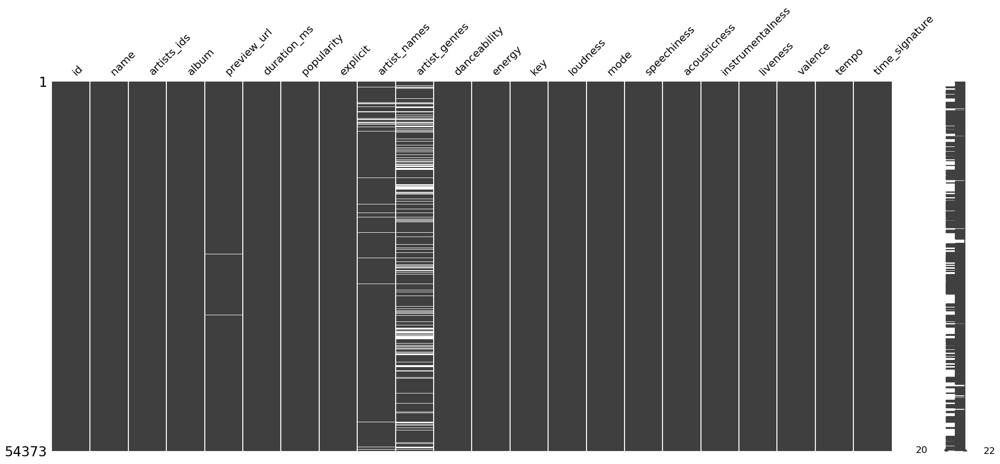

In [11]:
msno.matrix(data)

In [12]:
fig = px.histogram(data, x="popularity", nbins=100, title="Popularity of Songs", labels={"popularity": "Popularity"})
fig.show()

In [13]:
artist_genres = data['artist_genres'].str.split('/').explode().value_counts().sort_values(ascending=False)

fig = px.histogram(artist_genres, x=artist_genres.index, y=artist_genres.values, title="Genres of Songs", labels={"x": "Genre", "y": "Count"})
fig.show()

In [14]:
genres_with_1000 = artist_genres[artist_genres >= 1000]

fig = px.histogram(x=genres_with_1000.index, y=genres_with_1000.values, title="Genres of Songs", labels={"x": "Genre", "y": "Count"}, color=genres_with_1000.index)
fig.show()

In [15]:
artist_names = data['artist_names'].str.split('/').explode().value_counts().sort_values(ascending=False)

fig = px.histogram(artist_names, x=artist_names.index, y=artist_names.values, title="Artists of Songs", labels={"x": "Artist", "y": "Count"})
fig.show()

In [17]:
artists_with_10 = artist_names[artist_names >= 20]
fig = px.histogram(x=artists_with_10.index, y=artists_with_10.values, title="Artists of Songs", labels={"x": "Artist", "y": "Count"}, color=artists_with_10.index)
fig.show()

In [18]:
for feature in ['valence', 'danceability', 'energy', 'acousticness', 'instrumentalness', 'liveness', 'tempo', 'key']:
    fig = px.histogram(data, x=feature, nbins=100, title=feature.title() + " of Songs", labels={feature: feature.title()})
    fig.show()